# 1. Introduction

## GC7 

Milestone 2

Nama : Khalif Prabowo Santoso

Batch : Pondok Indah - 029

Dalam Melaksanakan GC7 Yaitu Melakukan Classification Pada Computer Vision Mengenai Kerusakan Pada Jalan. Dataset Ini Memuat 4 Class Yaitu Patch, Crack, Potholes, Surface Defects. Tujuan Dari Melakukan Predict Ini Adalah Membantu Untuk Bisa Mengambil Langkah Pencegahan Ataupun Langkah-Langkah Tepat Lainnya Yang Bisa Berguna Dalam Real-Worlds Cases.


## Background

URL Dataset : https://www.kaggle.com/datasets/patelmihir/road-defects-nonaugmented

Artificial Neural Network : Computer Vision - Mendeteksi Kerusakan Pada Jalan 

Problem : Kondisi jalan yang rusak, seperti retakan (cracks), lubang (potholes), tambalan (patch), dan cacat permukaan (surface defects), merupakan masalah serius di banyak negara, termasuk Indonesia.

Jalan yang rusak tidak hanya menyebabkan ketidaknyamanan bagi pengguna jalan, tetapi juga meningkatkan risiko kecelakaan lalu lintas, memperlambat distribusi logistik, dan menambah biaya perawatan kendaraan.

Di Indonesia, dengan jaringan jalan yang luas dan lalu lintas yang padat, pemeliharaan jalan seringkali masih dilakukan secara manual: petugas harus berkeliling untuk menginspeksi jalan, mencatat kerusakan, lalu melaporkannya. Hal ini tentu akan lebih memakan waktu lama, juga akan lebih mahal dikarenakan keterlambatan (tidak mencegah secara cepat), selain itu akan sulit diterapkan secara konsisten untuk wilayah yang luas.
Sehingga dengan menerapkan Computer Vision dalam mendeteksi kerusakan jalanan tentu akan memberikan banyak dampak positif.

Justifikasi : 
- https://otomotif.kompas.com/read/2024/01/25/092200115/jalan-rusak-di-indonesia-kerap-jadi-penyebab-kecelakaan-dan-kemacetanr 
- https://dprd.jemberkab.go.id/jalan-berlubang-di-kecamatan-jenggawah-telah-memakan-korban-komisi-c-dprd-jember-segera-panggil-dinas-terkait/
- https://kumparan.com/kumparannews/sederet-kasus-kecelakaan-di-jakarta-akibat-jalan-berlubang-200XyFG9Mqp

User/pengguna :
- Kementrian PUPR
- PT KAI
- Pemerintah Daerah

Kegunaan : 
- Inspeksi otomatis pada jalan. (Pemeliharaan Infrastruktur).
- Mendeteksi lebih dini terkait kerusakan untuk mencegah kecelakaan dan memastikan keselamatan publik meningkat (Jaminan Keselamatan).
- Mengurangi kegiatan inspeksi manual dan menurunkan biaya pemeliharaan (Efisiensi Biaya).

# 2. Import Libraries

In [71]:
import os
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import random
import pandas as pd
from PIL import Image
from collections import Counter
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
import tensorflow as tf
from sklearn.model_selection import train_test_split
import shutil
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.applications import MobileNetV2,DenseNet121
from sklearn.metrics import classification_report,confusion_matrix

# 3. Data Loading

In [67]:
print("TensorFlow Version:", tf.__version__)
print("Is GPU Available:", tf.config.list_physical_devices('GPU'))
print("NumPy:", np.__version__)

TensorFlow Version: 2.16.2
Is GPU Available: []
NumPy: 1.26.4


Ini Adalah Beberapa Version Dari Library Utama, Dan Juga Pada Device Yang Digunakan Tidak Terdeteksi Adanya GPU (Menjalankan Menggunakan CPU).

In [3]:
directory = "RoadDefects"  
data = []

# Automatically get class names from folder names
class_names = os.listdir(directory)

for class_name in class_names:
    class_folder = os.path.join(directory, class_name)
    
    if not os.path.isdir(class_folder):
        continue
    
    for filename in os.listdir(class_folder):
        img_path = os.path.join(class_folder, filename)
        
        try:
            with Image.open(img_path) as img:
                data.append({
                    'Class_Name': class_name,
                    'Img_Path': img_path,
                    'Shape': img.size + (len(img.getbands()),)
                })
        except:
            print(f"Skipped file: {img_path}")

df = pd.DataFrame(data)
df.sample(8)

,Class_Name,Img_Path,Shape
117,Potholes,RoadDefects/Potholes/8.jpg,"(1897, 1310, 3)"
91,Surface Defects,RoadDefects/Surface Defects/47.jpg,"(1450, 1135, 3)"
316,Cracks,RoadDefects/Cracks/9.jpg,"(1530, 1683, 3)"
44,Surface Defects,RoadDefects/Surface Defects/21.jpg,"(3182, 1708, 3)"
95,Surface Defects,RoadDefects/Surface Defects/90.jpg,"(2085, 1557, 3)"
85,Surface Defects,RoadDefects/Surface Defects/86.jpg,"(2039, 1730, 3)"
380,Cracks,RoadDefects/Cracks/155.jpg,"(864, 796, 3)"
65,Surface Defects,RoadDefects/Surface Defects/94.jpg,"(1855, 1169, 3)"


Show Sample Data Dari Directory Kedalam DataFrame (Class, Path, Shape)

In [75]:
for class_name in os.listdir(directory):
    class_path = os.path.join(directory, class_name)
    if os.path.isdir(class_path):
        num_images = len([
            f for f in os.listdir(class_path)
            if os.path.isfile(os.path.join(class_path, f)) and f.lower().endswith(('.jpg', '.png', '.jpeg'))
        ])
        print(f"Found {num_images} images in '{class_name}'")

Found 100 images in 'Surface Defects'
Found 100 images in 'Potholes'
Found 100 images in 'Patch'
Found 100 images in 'Cracks'


Distribusi Atau Sebaran Data Dalam Dataset Ini

# 4. Exploratory Data Analysis (EDA)

## 4.1 Class Distribution Percentage

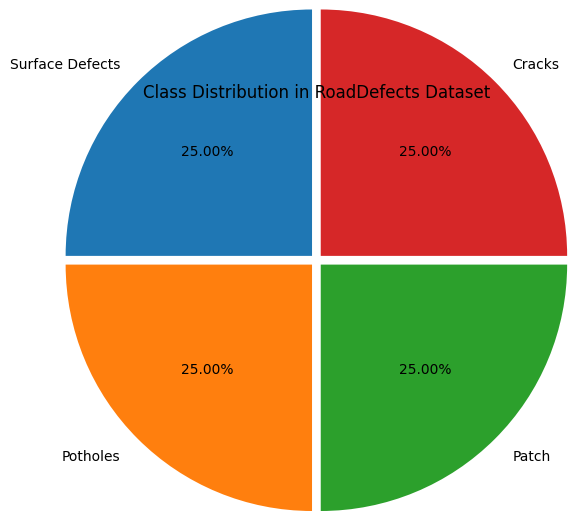

In [5]:
directory = "RoadDefects"
class_counts = {}

# Count number of image files in each class folder
for class_name in os.listdir(directory):
    class_path = os.path.join(directory, class_name)
    if os.path.isdir(class_path):
        count = len([
            fname for fname in os.listdir(class_path)
            if fname.lower().endswith(('.jpg'))
        ])
        class_counts[class_name] = count

# Plot the pie chart
plt.figure(figsize=(20, 4))
plt.pie(class_counts.values(),
        labels=class_counts.keys(),
        autopct='%0.2f%%',
        startangle=90,
        explode=[0.05] * len(class_counts),
        radius=2)
plt.title("Class Distribution in RoadDefects Dataset")
plt.show()

**Berdasarkan hasil visualisasi, terlihat bahwa:**
1. Dataset memiliki 4 class, yaitu: Surface Defects, Cracks, Potholes, Patch.
2. Dataset juga memiliki distribusi yang balance atau seimbang. Terlihat dari piechart yang dihasilkan, tiap kelasnya memiliki proprosi sebesar 25%.
3. Berdasarkan data yang balance atau seimbang, ini bisa menjadi keuntungan sehingga model tidak dominan terhadap satu kelas. 

## 4.2 Image Unique Sizes

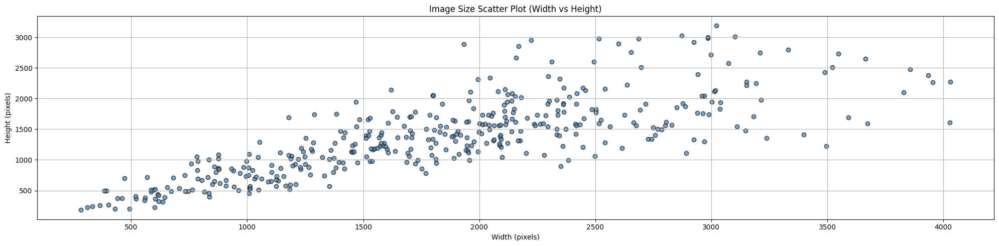

Found 400 Images In Total.
Found 400 Unique Sizes.



In [6]:
sizes = []
widths, heights = [], []

for cls in os.listdir(directory):
    cls_path = os.path.join(directory, cls)
    if not os.path.isdir(cls_path): continue
    for fname in os.listdir(cls_path):
        if fname.lower().endswith('.jpg'):
            img_path = os.path.join(cls_path, fname)
            with Image.open(img_path) as img:
                size = img.size
                sizes.append(size)
                widths.append(size[0])
                heights.append(size[1])

# Scatter Plot
plt.figure(figsize=(20, 5))
plt.scatter(widths, heights, alpha=0.7, color='steelblue', edgecolor='black')
plt.title("Image Size Scatter Plot (Width vs Height)")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Print Summary
size_counter = Counter(sizes)
print(f"Found {len(sizes)} Images In Total.")
print(f"Found {len(size_counter)} Unique Sizes.\n")


**Berdasarkan hasil visualisasi, terlihat bahwa:**
1. Dari visual scatter plot, distribusi datanya tersebar cukup luas. Dimana data-datanya cenderung tidak ada yang bertindihan atau sama.
2. Sehingga untuk melakukan validasi, kita akan menggunakan Counter.
3. Terlihat dari output counter bahwa dari 400 dataset(image), ada 400 Unique Size yang artinya semua size heigh/width data berbeda.
4. Hal ini dapat disolusikan dengan melakukan resize pada datanya. Hal ini juga bertujuan untuk memudahkan dalam preprocessing dan juga kebutuhan pada saat menggunakan Transfer Learning. 

## 4.3 Color Modes Distribution Each Class

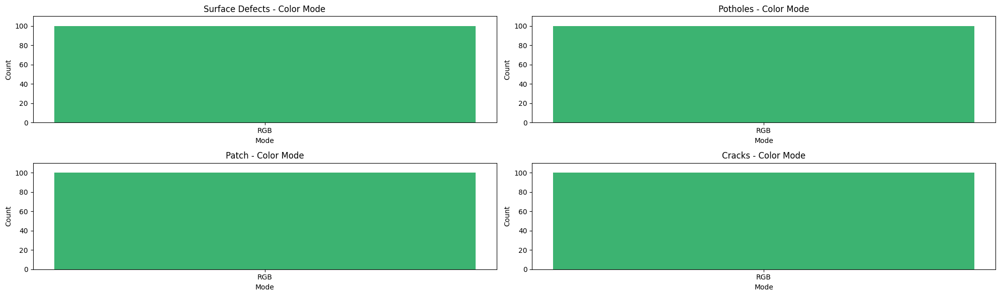

In [7]:
class_modes = {} 

# Collect modes per class
for cls in os.listdir(directory):
    cls_path = os.path.join(directory, cls)
    if not os.path.isdir(cls_path): continue
    modes = []
    for fname in os.listdir(cls_path):
        if fname.lower().endswith('.jpg'):
            img_path = os.path.join(cls_path, fname)
            with Image.open(img_path) as img:
                modes.append(img.mode)
    class_modes[cls] = Counter(modes)

# Plot
fig, axs = plt.subplots(2, 2, figsize=(20, 6))  # 2x2 layout
axs = axs.flatten()

for i, (cls, mode_counter) in enumerate(class_modes.items()):
    ax = axs[i]
    ax.bar(mode_counter.keys(), mode_counter.values(), color='mediumseagreen')
    ax.set_title(f"{cls} - Color Mode")
    ax.set_xlabel("Mode")
    ax.set_ylabel("Count")
    ax.set_ylim(0, max(mode_counter.values()) + 10)

plt.tight_layout()
plt.show()

**Berdasarkan hasil visualisasi, terlihat bahwa:**
1. Mengacu pada distribusi kelas(25% per kelas), tiap kelasnya memiliki modes yang sama.
2. Modes sama yang pada dataset ini adalah RGB.
3. Dikarenakan oleh kesamaan dalam color modes pada dataset ini, maka tidak diperlukan untuk menyamakan modes. Kecuali, ada kebutuhan Transfer Learning.

## 4.4 Show 5 Random Sample Of Each Class.

Surface Defects: 100 images


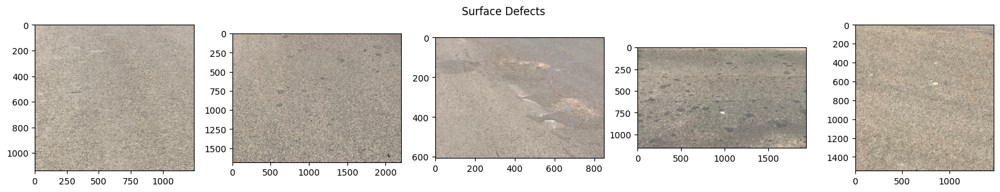

Potholes: 100 images


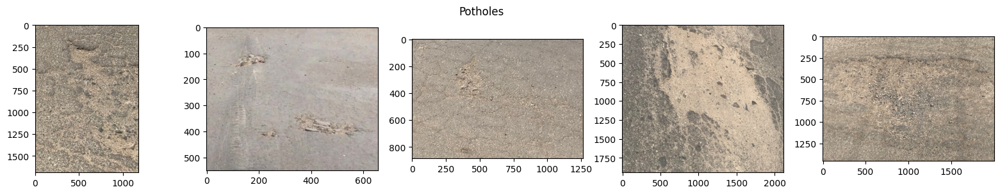

Patch: 100 images


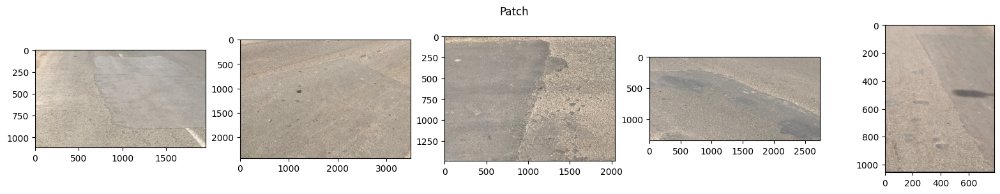

Cracks: 100 images


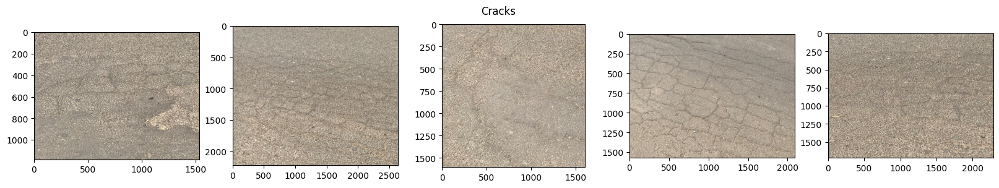

In [8]:
# Loop Untuk Show 5 Random Sample
classes = os.listdir(directory)

for cls in classes:
    cls_path = os.path.join(directory, cls)
    files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg'))]
    print(f"{cls}: {len(files)} images")

    if len(files) >= 5:
        samples = random.sample(files, 5)

    plt.figure(figsize=(20,3))
    for i, fname in enumerate(samples):
        img_path = os.path.join(cls_path, fname)
        img = Image.open(img_path)

        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        
    plt.suptitle(f"{cls}")
    plt.show()


**Berdasarkan hasil visualisasi, terlihat bahwa:**

Ini adalah sample images tiap kelas, dimana di setiap visualnya diperlihatkan jumlah data tiap kelas serta pixel yang dimiliki sample imagesnya.Berikut adalah ciri-ciri yang dapat disimpulkan berdasarkan sample tiap kelasnya:
1. Surface Defects
- Adanya kecacatan di permukaan aspal, terlihat bahwa dari sample setiap jalannya cenderung kasar.
2. Potholes
- Jalanan memiliki lubang pada permukaan jalannya.
3. Patch
- Jalanan memiliki tambalan atau perbaikan, biasanya jalan yang sudah ditambal permukaannya memiliki warna yang sedikit berbeda.
4. Cracks
- Jalanan memiliki retakan yang cukup banyak.

# 5. Feature Engineering

## 5.1 Split Data

Berdasarkan Dataset yang di-download, juga pada saat melakukan EDA serta Data Loading. Kita mengetahui bahwa datasets ini hanya terdiri dari 1 Folder 'RoadDefects' dengan 4 subfolder yang merepresentasikan tiap-tiap kelasnya. Sehingga, sebelum masuk ke process Image Augmentation, Preprocessing, Model Definition, etc. Kita akan melakukan spliting data terlebih dahulu.

### 5.1.1 Data Loading (Spliting Into New Folders)

In [9]:
base_dir = "RoadDefects"
all_images = []
all_labels = []

for label in os.listdir(base_dir):
    class_dir = os.path.join(base_dir, label)
    if os.path.isdir(class_dir):
        for fname in os.listdir(class_dir):
            if fname.lower().endswith(('.jpg')):
                all_images.append(os.path.join(class_dir, fname))
                all_labels.append(label)

train_imgs, temp_imgs, train_labels, temp_labels = train_test_split(
    all_images, all_labels, test_size=0.3, stratify=all_labels, random_state=25)

val_imgs, test_imgs, val_labels, test_labels = train_test_split(
    temp_imgs, temp_labels, test_size=0.5, stratify=temp_labels, random_state=25)

def copy_files(filepaths, labels, dest_dir):
    for path, label in zip(filepaths, labels):
        dest_class_dir = os.path.join(dest_dir, label)
        os.makedirs(dest_class_dir, exist_ok=True)
        shutil.copy(path, os.path.join(dest_class_dir, os.path.basename(path)))

copy_files(train_imgs, train_labels, "RoadDefectsNew/train")
copy_files(val_imgs, val_labels, "RoadDefectsNew/val")
copy_files(test_imgs, test_labels, "RoadDefectsNew/test")

Berdasarkan Hasil Spliting:
1. Melakukan spliting data dengan langsung membuat folder baru 'RoadDefectsNew' yang sudah memuat 3 subfolder train,val,set. 
2. Proporsi split adalah 0.7 0.15 0.15.
3. Sehingga Totalnya adalah 280 Pada Train, 60 Pada Validation, 60 Pada Test.

### 5.1.2 Data Validation After Spliting

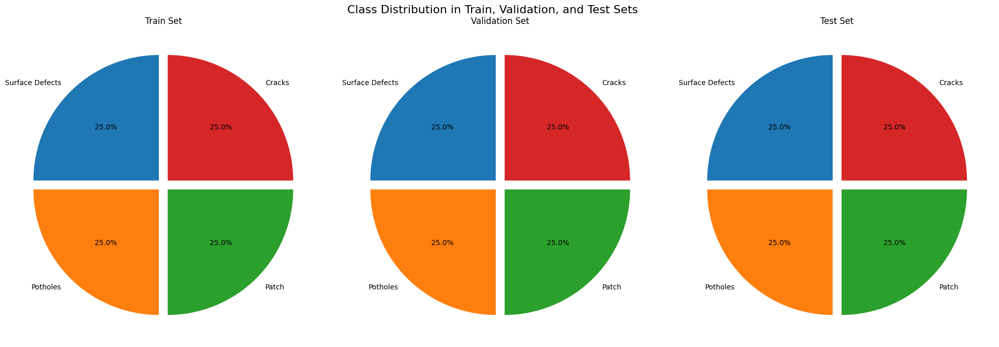

In [10]:
# Check Hasil Spliting
def get_class_counts(subset_dir):
    labels = []
    for label in os.listdir(subset_dir):
        class_dir = os.path.join(subset_dir, label)
        if os.path.isdir(class_dir):
            labels.extend([label] * len(os.listdir(class_dir)))
    return Counter(labels)

# Get counts for each split
train_counts = get_class_counts("RoadDefectsNew/train")
val_counts = get_class_counts("RoadDefectsNew/val")
test_counts = get_class_counts("RoadDefectsNew/test")

# Plot pie charts
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

for ax, counts, title in zip(
    axes,
    [train_counts, val_counts, test_counts],
    ["Train Set", "Validation Set", "Test Set"]
):
    labels = counts.keys()
    sizes = counts.values()
    ax.pie(sizes, labels=labels, autopct="%1.1f%%", startangle=90, explode=[0.05]*len(labels))
    ax.set_title(title)

plt.suptitle("Class Distribution in Train, Validation, and Test Sets", fontsize=16)
plt.tight_layout()
plt.show()

Berdasarkan Hasil Spliting Sebaran Datanya Tetap Balance Yaitu Di Angka 25% Per Classnya Baik Di Train,Validation, Maupun Test Set.

## 5.2 Configuration

In [22]:
# Model Configuration
img_height = 224
img_width = 224
batch_size = 20
seed = 25

Configuration:
1. Umumnya menggunakan model CNN setting sizenya 224 x 224.
2. Selain itu, dalam melakukan training atau preprocessing dataset dibagi kedalam 15 batch size(jumlah data / 15).
3. Serta mendefine seed.

Keuntungan:
- Model akan lebih optimal dikarenakan size yang sama dan sudah mengikuti panduan size dalam Architecture CNN.
- Pembagian kedalam small batch ini maka data akan di update lebih sering dan melakukan generalisasi lebih baik, walaupun akan sedikit lebih lambat.
- Seed seperti random_state, sehingga data yang dipecah, jika dilakukan run berulang pemisahannya tetap sama.


## 5.3 Image Augmentation

Ini Adalah Function Yang Bertujuan Untuk Mengcompare Suatu Sample Images Ketika Sebelum Dan Sesudah Melakukan Augmentation.

In [11]:
# Load Sample Image
img = load_img("RoadDefectsNew/train/Cracks/3.jpg")  
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)

# Function To Compare Actual Image Vs Augmented Images
def compare_aug(title, datagen):
    aug_iter = datagen.flow(img_array, batch_size=1)
    aug_img = next(aug_iter)[0] / 255.0

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    axes[0].imshow(img_array[0] / 255.0)
    axes[0].set_title("Original")
    axes[0].axis("off")
    
    axes[1].imshow(aug_img)
    axes[1].set_title(title)
    axes[1].axis("off")
    
    plt.tight_layout()
    plt.show()

Pada Saat Melakukan Augmentasi Ada Beberapa Parameter Augmentation Yang Berpotensi Untuk Digunakan:
1. Zoom
- Melakukan Zoom Atau Memperbesar Gambar Dengan Konsiderasi Image Dapat Lebih Terlihat.
2. Brightness
- Melakukan Tambahan Penerangan Pada Gambar Sehingga Diharapkan Gambar Lebih Terang Dapat Menampilkan Hasil Yang Lebih Mudah Untuk Dipelajari.
3. Horizontal Flip
- Melakukan Flip Secara Horizontal Pada Foto Untuk Melihat Gambar Dari Angle Yang Berbeda.
4. Height Shift
- Memperpanjang Gambar Keatas Untuk Memberikan Angle Shifting Berbeda.
5. Width Shift
- Memperlebar Panjang Gambar Untuk Memberikan Angle Shifting Berbeda.
6. Rotation
- Melakukan Pemutaran Pada Gambar Dengan Derajat Tertentu Diharapkan Akan Memberikan Hasil Yang Lebih Mudah Dipelajari.
7. Shear
- Menggeser Beberapa Pixel Pada Gambar Untuk Memberikan Perspective Yang Baru.
8. Fill Mode
- Mengisi Missing Pixel Dengan Mode 'Nearest' Atau Mengambil Dari Pixel Terdekat. Hal Ini Membuat Gambar Akan Lebih Mudah Dipelajari Dikarenakan Pixel-Pixel Yang Missing Terisi.

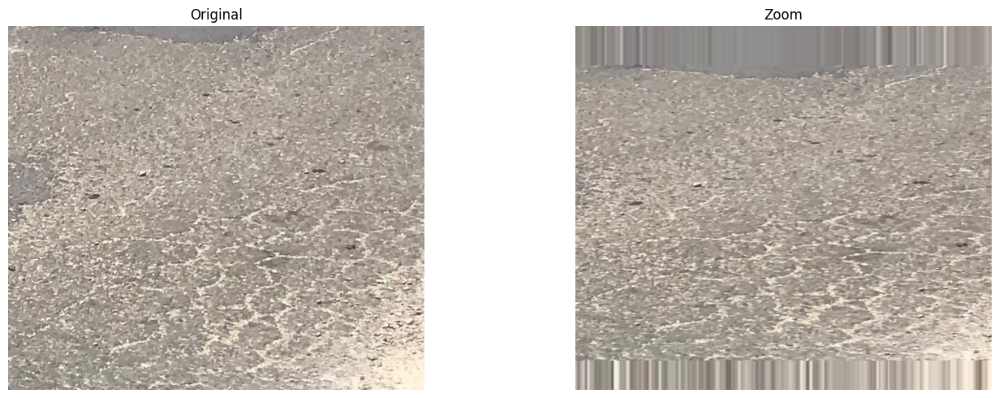

In [12]:
compare_aug("Zoom", ImageDataGenerator(zoom_range=0.3))

> Terlihat Gambar Membesar Jika Dibandingkan Dengan Original.

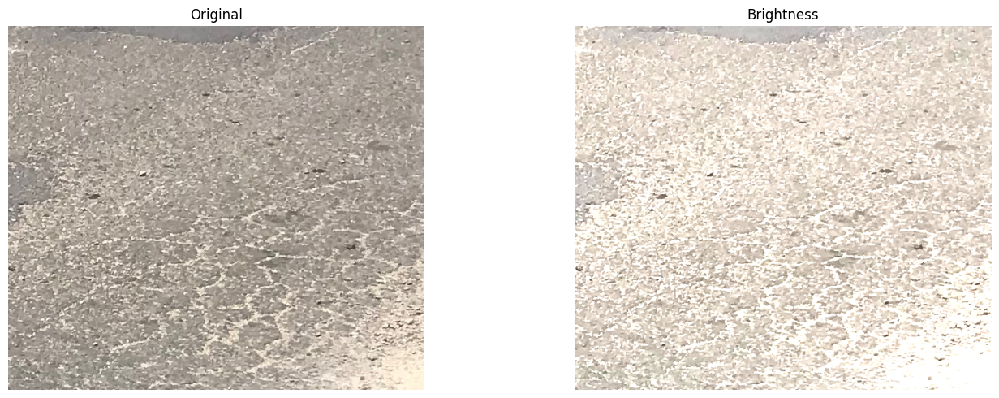

In [13]:
compare_aug("Brightness", ImageDataGenerator(brightness_range=[1,1.5]))

> Terlihat Gambar Lebih Terang Jika Dibandingkan Dengan Original.

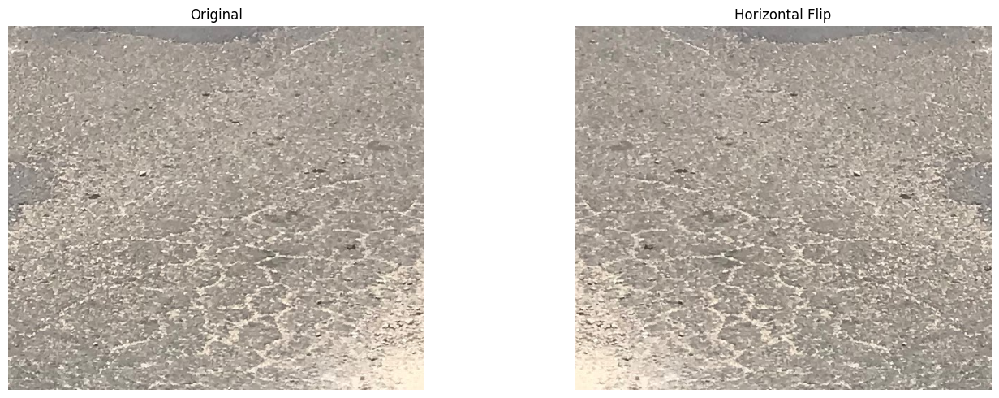

In [14]:
compare_aug("Horizontal Flip", ImageDataGenerator(horizontal_flip=True))

> Terlihat Gambar TerFlip Secara Horizontal Jika Dibandingkan Dengan Original.

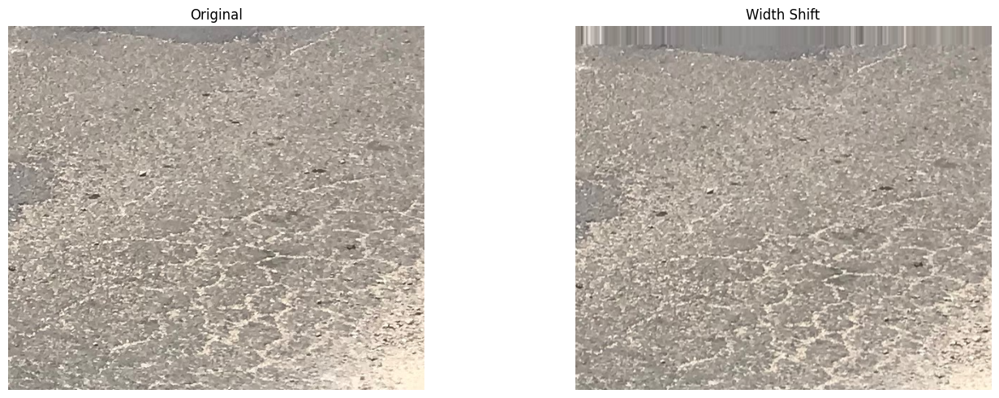

In [15]:
compare_aug("Width Shift", ImageDataGenerator(width_shift_range=0.2))

> Terlihat Panjang Teradjust Jika Dibandingkan Dengan Original.

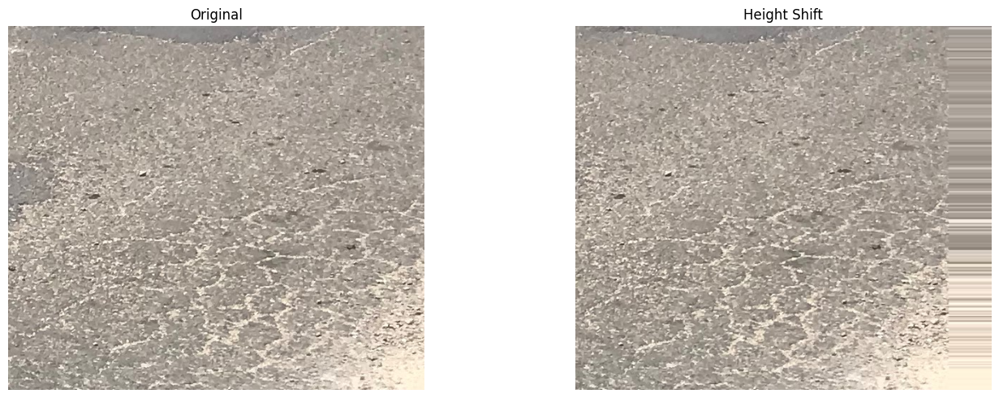

In [16]:
compare_aug("Height Shift", ImageDataGenerator(height_shift_range=0.2))

> Memperpanjang Tinggi Gambar Dan Terlihat Lebih Tinggi Jika Dibandingkan Original

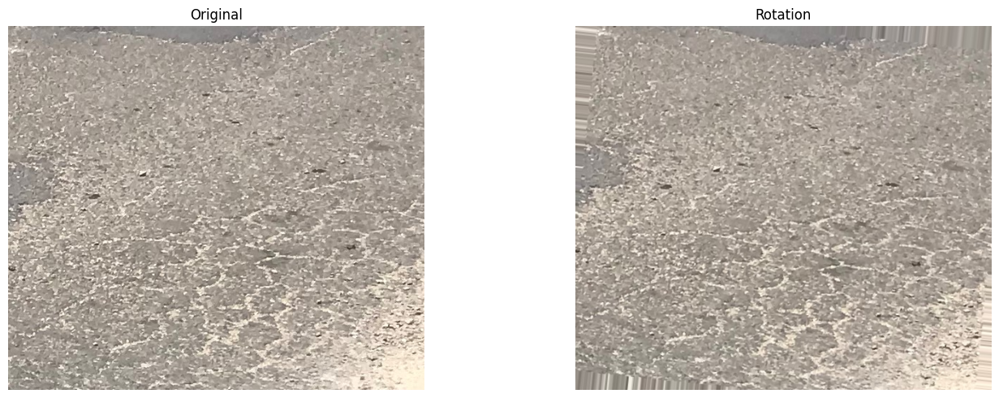

In [17]:
compare_aug("Rotation", ImageDataGenerator(rotation_range=10))

> Terlihat Gambar Berputar Jika Dibandingkan Dengan Original

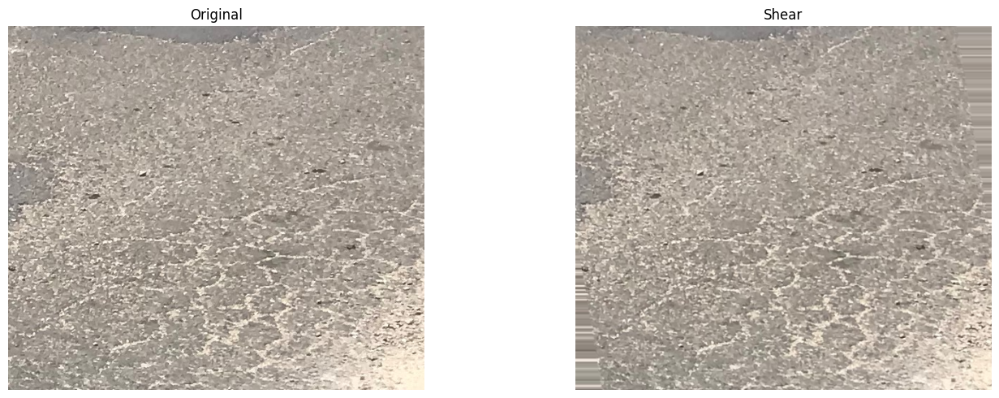

In [18]:
compare_aug("Shear", ImageDataGenerator(shear_range=10))

> Terlihat Gambar Terjadi Perbedaan Dengan Original.

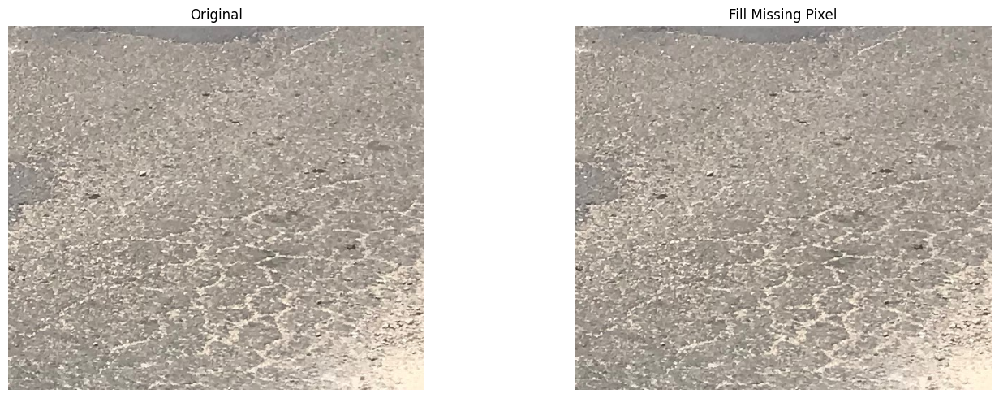

In [19]:
compare_aug("Fill Missing Pixel", ImageDataGenerator(fill_mode='nearest'))

> Secara Visual Tidak Terlalu Terlihat Tetapi Melakukan Fill_Mode Ini Membantu Missing Pixel Dalam Model Belajar

## 5.4 Augmentation Preprocessing

Berdasarkan Hasil Augmentasi Diatas:
1. Ada 8 Augmentasi Yang Berpotensi Untuk Dimasukkan Kedalam Image Augmentation.
2. Telah Dilakukan Lebih Dari 10x Percobaan Dalam Melakukan Train Model.
3. Pada Beberapa Percobaan Menghasilkan Hasil Yang Kurang Maksimal (val_loss dan accuracy).
4. Sehingga Hasil Augmentasi Akhir Ini Merupakan Hasil Terbaik Untuk Base Model, Walaupun Hasilnya Tetap Kurang Maksimal.
5. Jadi Dari 8 Augmentasi Hanya 5 Augmentasi Yang Dilakukan (+1 Rescale).

In [20]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    width_shift_range=0.1,
    height_shift_range=0.1,
    rotation_range=10,
    fill_mode = 'nearest')

val_test_datagen = ImageDataGenerator(rescale=1./255)

Preprocessing Kedalam Dataset.

In [99]:
train = train_datagen.flow_from_directory(
    "RoadDefectsNew/train",
    target_size=(img_height,img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle = True,
    seed=seed
)

val = val_test_datagen.flow_from_directory(
    "RoadDefectsNew/val",
    target_size=(img_height,img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle = True,
    seed = seed
)

test = val_test_datagen.flow_from_directory(
    "RoadDefectsNew/test",
    target_size=(img_height,img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False,
    seed = seed
)

Found 280 images belonging to 4 classes.
Found 60 images belonging to 4 classes.
Found 60 images belonging to 4 classes.


Berdasarkan Hasil Preprocessing:
1. Dilakukan Augmentation Hanya Kedalam Train Set.
2. Rescale Dilakukan Kedalam Semua Set (Train,Validation,Test).
3. Class Mode Categorical Dikarenakan Terdapat 4 Class.
4. Seed Serta Batch Size Telah Mengikuti Define Dari Hasil Configuration.
5. Shuffle
- Pada Train Dan Test Dilakukan Shuffle = 'True' Dikarenakan Untuk Mengambil Gambar Acak Yang Akan Masuk Ke Model Untuk Menghindari Overfitting/Bias Serta Bertujuan Melakukan Evaluasi Secara Acak Sehingga Prediction Validation Dapat Di Compare.
- Pada Test Shuffle 'False' Sehingga Hasil Prediksi Dengan Label Sama.
6. Selain Itu Datagen.flow.from_directory Bertujuan Untuk Mengambil Data Dari Directory Sekaligus Meng-Encode Labelnya.

# 6 Base Model 

## 6.1 Base Model Architecture

In [25]:
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', padding='same',input_shape=(img_height,img_width, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(2, 2))

model.add(Conv2D(64, (3, 3), padding='same',activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2, 2))

model.add(Conv2D(128, (3, 3),padding='same', activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(2, 2))

model.add(GlobalAveragePooling2D())

model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(4, activation='softmax'))

model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 111,172 (434.27 KB)

 Trainable params: 110,724 (432.52 KB)

 Non-trainable params: 448 (1.75 KB)

Pada Architecture Base Model Ada Beberapa Layer Yang Di-Define:
1. Model Sequential:
- Mudah Untuk Dibaca, Dibuat, Serta Dimodifikasi.

2. Input Layer:
- Input Shapes (img_height, img_width, 3)
Define Shapes Pada Input.
- Conv2D(32, (3, 3))
Memberikan 32 Filter Berukuruan (3x3) Untuk Mengestrak Fitur Tingkat Rendah. 
- Activation=‘relu’:
ReLU (Rectified Linear Unit) Membantu Untuk Memdefine Non-linearitas, Memungkinkan Model Untuk Mempelajari Pola Yang Kompleks Serta Membantu Menghindari Missing Gradient
- Padding=‘same’:
Menjaga Ukuran Output Sama Dengan Input, Sehingga Informasi Terjaga.

3. BatchNormalization()
- Menormalisasikan Output Dari Layer Sebelumnya.
- Membantu Menstabilkan Serta Mempercepat Proses Training.

4. MaxPooling2D(2, 2)
- Mengurangi Resolution Feature Dengan Mengambil Nilai Maks Dalam Blok 2x2.
- Mengurangin Dimensi Sehingga Dapat Mengurangi Overfitting.
- Menjaga Feature-Feature Yang Dominan.

5. Conv2D(64,) Conv2D(128,)
- 64 - 128 > Layer Yang Lebih Dalam Sehingga Mampu Memahami Feature Yang Lebih Complex.

6. GlobalAveragePooling2D()
- Menghitung Rata-Rata Dari Map Dengan Mengurangi Parameter
- Mencegah Overfitting Dibandingkan Dengan Fungsi Flatten().

7. Dense(128, activation='relu')
- Melakukan Connect Dengan Layer-Layer Sebelumnya. 

8. Dropout(0.3)
- Secara Acak Drop 30% Dari Neuron.
- Membantu Mencegah Overfitting.

9. Dense(4, activation='softmax')
- Output Layer Dengan 4 Neuron (Terdapat 4 Classes)
- Menghasilkan Distribusi Probability Antar Kelas
- Dan Menjadikan Probability Tertinggi Sebagai Output.

10. compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
- 'categorical_crossentropy': Untuk Classification MultiClass (Yang Sudah Di Encode).
- Adam: Optimizer Yang Lebih General Dan Efisien.
- Accuracy: Metrics Untuk Membantu Penilaian Training.

## 6.2 Base Model Fit

In [26]:
# Define EarlyStop Untuk Mencari Epoch Terbaik Dengan Patience Sebesar 8 Serta Dengan Monitar 'val_los'.
earlystop = EarlyStopping(monitor = 'val_loss', restore_best_weights = True, patience = 8,verbose = 1)

In [27]:
# Mengurangi Persentase Belajar Ketika Dalam 3 Epoch Tidak Terjadi Improvement.
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

In [28]:
history = model.fit(train, epochs=25, validation_data=val, batch_size=batch_size, callbacks= [earlystop, reduce_lr])

/opt/miniconda3/envs/tfenv310/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.3527 - loss: 1.5274 - val_accuracy: 0.2500 - val_loss: 1.3904 - learning_rate: 0.0010
Epoch 2/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.4789 - loss: 1.1962 - val_accuracy: 0.2667 - val_loss: 1.3842 - learning_rate: 0.0010
Epoch 3/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.3898 - loss: 1.2949 - val_accuracy: 0.2833 - val_loss: 1.3834 - learning_rate: 0.0010
Epoch 4/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.4187 - loss: 1.2873 - val_accuracy: 0.2500 - val_loss: 1.3802 - learning_rate: 0.0010
Epoch 5/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.4641 - loss: 1.1359 - val_accuracy: 0.2167 - val_loss: 1.4157 - learning_rate: 0.0010
Epoch 6/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 30s 2s/step - accuracy: 0.5492 - loss: 1.0204 - val_accuracy: 0.2500 - val_loss: 1.4449 - learning_rate: 0.0010
Epoch 7/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5518 - loss: 1.0192
Epoch 7: ReduceLR

Data Ini Telah Di Run Dalam Beberapa Percobaan, Mulai Dari Mengurangi Layer Hingga Augmentation.
Epoch Yang Dilakukan Pun Hanya 25 Berdasarkan Konsiderasi Jarang Melakukan Improve Setelah Epoch Ke-5.

Sehingga Berdasarkan Hasil Train Dan Epoch Terbaik Mengacu Pada Parameters 'Callbacks':
1. Epoch 4 Yang Menjadi Hasil Terbaik.
2. Accuracy: 0.4187
3. loss: 1.2873 
4. val_accuracy: 0.2500
5. val_loss: 1.3802

Sehingga Model Ini Dapat Dikategorikan 'Underfit' Mengacu Pada Threshold Accuracy 0.6. Model Inipun Tidak Tergeneralisasi Secara Baik Mengacu Pada val_loss Yang Tinggi Dan Tidak Improve. Namun, Bisa Juga Dikategorikan 'Overfit' Karena Hasil Train Lebih Bagus Dibandingkan Dengan Val-Set.

## 6.3 Base Model Evaluation

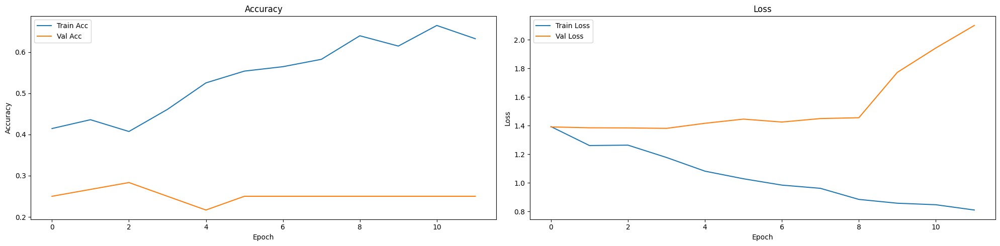

In [29]:
fig, axes = plt.subplots(1, 2, figsize=(20, 5))

axes[0].plot(history.history['accuracy'], label='Train Acc')
axes[0].plot(history.history['val_accuracy'], label='Val Acc')
axes[0].set_title('Accuracy')
axes[0].legend()
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')

axes[1].plot(history.history['loss'], label='Train Loss')
axes[1].plot(history.history['val_loss'], label='Val Loss')
axes[1].set_title('Loss')
axes[1].legend()
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.show()

Ini Adalah Hasil Visual Dari Hasil Training Terlihat Bahwa Benar Hasilnya Adalah Overfit Karena:
1. Accuracy Training meningkat secara bertahap hingga 65%, sementara
2. Sementara Accuracy Validation tetap rendah, stagnan di sekitar 25–28%
3. Train Loss menurun secara bertahap hingga ~0.85. Namun, Tetap Tinggi.
4. Val Loss Meningkat setelah epoch ke-6, menunjukkan bahwa model berhasil menyesuaikan data pelatihan tetapi gagal generalisasi.

In [57]:
y_pred_prob = model.predict(test)
y_pred_class = np.argmax(y_pred_prob, axis=1)
y_true = test.classes

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 751ms/step


In [76]:
# Classification Report
print(classification_report(y_true, y_pred_class, target_names=class_labels, zero_division=0))

                 precision    recall  f1-score   support

         Cracks       0.00      0.00      0.00        15
          Patch       0.00      0.00      0.00        15
       Potholes       0.25      1.00      0.40        15
Surface Defects       0.00      0.00      0.00        15

       accuracy                           0.25        60
      macro avg       0.06      0.25      0.10        60
   weighted avg       0.06      0.25      0.10        60



Berdasrkan Hasil Classification Report:
- Model memprediksi semua hal sebagai ‘Potholes’ Terlepas Dari Class Sebenarnya.
- Recall '1.00' untuk Potholes Artinya semua prediksi adalah Potholes, jadi model menangkap semuanya secara kebetulan.
- Precision untuk kelas lain adalah 0 Karena model tidak pernah memprediksi mereka.

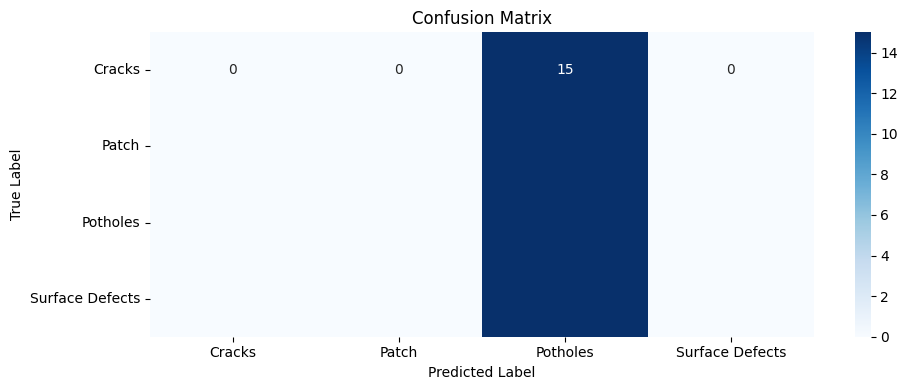

In [94]:
cm = confusion_matrix(y_true, y_pred_class)
plt.figure(figsize=(10,4))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

Hal Yang Sama Juga Dari Hasil Confusion Metrics Ini Yang Mana:
- Diagonal keseluruhan 0 Kecuali Potholes
= Semua 60 sampel uji (15 per kelas) diprediksi sebagai 'PotHoles'
- Ini Menunjukkan Bahwa Model Tidak Mengingat Pola Secara Baik Namun Hanya Mengingat.

## 6.4 Recommendation

Dikarenakan Data Ini Tidak Berjalan Dengan Baik Dan Memiliki Hasil Yang Buruk Dan Terindikasi Overfit Maka.

Reccomendation Untuk Mengimprove Hasil:
1. Memperbanyak Dataset Yang Lebih Repsentative.
2. Melakukan Architecture Yang Lebih Kompleks
3. Juga Menambahkan beberapa Regularization Pada Architecture
4. Juga Augmentasi Yang Lebih Sesuai
5. Mengimprove Dengan Menggunakan Transfer Learning

# 7. Model Improvement

## 7.1 Model Improvement Using MobileNetV2

### 7.1.1 Define Model Improvement Using MobileNetV2

Alasan Penggunaan:
1. MobileNetV2 telah dilatih pada jutaan gambar dari 1.000 kelas.Dengan menggunakannya, model dapat mengekstraksi fitur yang lebih baik daripada harus belajar dari nol.Hal ini berguna dikarenakan dataset yang kecil2 dan dapat menyebabkan overfitting dengan cepat.
2. Jauh lebih tahan terhadap overfitting dibandingkan model lain seperti ResNet atau melatih CNN dengan architecture sendiri.
3. Dapat Melakukan Freeze Model Sehingga Model Dapat Beradaptasi Dengan Lebih Baik.
4. Layer awal mampu menangkap tepi, tekstur, dan pola lebih baik.

In [30]:
# Define Transfer Learning MobileNetV2
mobilenet = MobileNetV2(include_top=False, weights='imagenet', input_shape=(img_height, img_width, 3))
mobilenet.trainable = False

In [31]:
# Summary Dari MobileNetV2
mobilenet.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

### 7.1.2 Model Improvement Using MobileNetV2 Architecture

In [44]:
# MobileNetV2 Architecture
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

model_tl = Sequential()

model_tl.add(mobilenet)
model_tl.add(GlobalAveragePooling2D())

model_tl.add(Dropout(0.3))
model_tl.add(Dense(128, activation='relu'))
model_tl.add(BatchNormalization())
model_tl.add(Dropout(0.3))

model_tl.add(Dense(4, activation='softmax'))

model_tl.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [45]:
# Define EarlyStop Untuk Mencari Epoch Terbaik Dengan Patience Sebesar 8 Serta Dengan Monitar 'val_los'.
earlystop2 = EarlyStopping(monitor = 'val_loss', restore_best_weights = True, patience = 8,verbose = 1)

In [46]:
history_mobile = model_tl.fit(train, epochs=35, validation_data=val, callbacks= [earlystop2, reduce_lr])

Epoch 1/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.3377 - loss: 1.8131 - val_accuracy: 0.5333 - val_loss: 1.3966 - learning_rate: 0.0010
Epoch 2/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.5423 - loss: 1.3120 - val_accuracy: 0.4333 - val_loss: 1.6252 - learning_rate: 0.0010
Epoch 3/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.6176 - loss: 1.0235 - val_accuracy: 0.4500 - val_loss: 1.3163 - learning_rate: 0.0010
Epoch 4/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.6046 - loss: 1.0051 - val_accuracy: 0.5500 - val_loss: 1.1417 - learning_rate: 0.0010
Epoch 5/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.6470 - loss: 0.8476 - val_accuracy: 0.5667 - val_loss: 1.1225 - learning_rate: 0.0010
Epoch 6/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.6484 - loss: 0.9266 - val_accuracy: 0.6167 - val_loss: 0.8004 - learning_rate: 0.0010
Epoch 7/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.7315 - loss: 0.8004 - val_accuracy: 

Data Ini Telah Di Run Dalam Beberapa Percobaan, Salah Satunya Dengan Memodifikasi Architecturenya
Epoch Yang Dilakukan Mulai Dari 25 Namun Tidak Terjadi Callbacks Sehingga Di Indikasi Bahwa Dalam Beberapa layer Kedepan Bisa Improve.
Namun, Ternyata Setelah Di Adjust Epoch 35 Model Melakukan Callbacks Dan Mengambil Epoch 6.

Sehingga Berdasarkan Hasil Train Dan Epoch Terbaik Mengacu Pada Parameters 'Callbacks':
1. Epoch 6 Yang Menjadi Hasil Terbaik.
2. Accuracy: 0.6484
3. loss: 0.9266
4. val_accuracy:0.6167 
5. val_loss: 0.8004

Sehingga Model Ini Dapat Dikategorikan 'Overfit'. Dikarenakan Accuracy Lebih Baik Pada Train Dibandingkan Val.
Walaupun Perbedaan Hanya Sedikit Tetapi Jika Mengacu Pada Val-Loss Yang Tetap Cukup Tinggi Di Angka 0.8. Model Ini Tetap Dikategorikan Baik.
Walaupun Juga Hasil Ini Improve Dari Base Model.

### 7.1.3 Model Improvement Using MobileNetV2 Evaluation

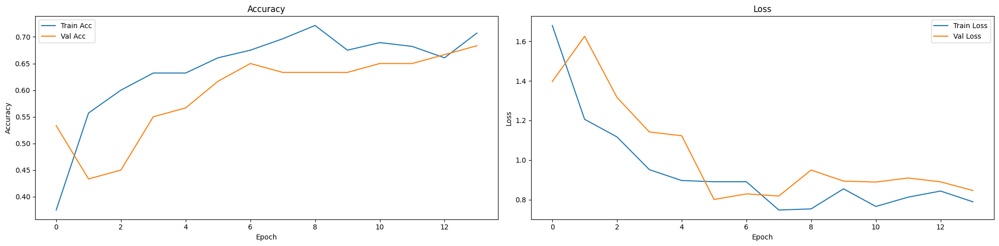

In [47]:
fig, axes = plt.subplots(1, 2, figsize=(20, 5))

axes[0].plot(history_mobile.history['accuracy'], label='Train Acc')
axes[0].plot(history_mobile.history['val_accuracy'], label='Val Acc')
axes[0].set_title('Accuracy')
axes[0].legend()
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')

axes[1].plot(history_mobile.history['loss'], label='Train Loss')
axes[1].plot(history_mobile.history['val_loss'], label='Val Loss')
axes[1].set_title('Loss')
axes[1].legend()
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.show()

Berdasrkan Hasil Visualisasi:
1. Accuracy Train meningkat secara bertahap.
2. Accuracy Pada Val juga meningkat, menunjukkan generalisasi yang cukup baik.
3. Pada Train Dan Val Loss Juga Menurun Cukup Stabil.

In [78]:
y_pred_mobile = model_tl.predict(test)
y_pred_class_mobile = np.argmax(y_pred_mobile, axis=1)
y_true_mobile = test.classes

3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 683ms/step


In [79]:
print(classification_report(y_true_mobile, y_pred_class_mobile, target_names=class_labels, zero_division=0))

                 precision    recall  f1-score   support

         Cracks       1.00      0.27      0.42        15
          Patch       0.71      0.80      0.75        15
       Potholes       0.91      0.67      0.77        15
Surface Defects       0.46      0.87      0.60        15

       accuracy                           0.65        60
      macro avg       0.77      0.65      0.64        60
   weighted avg       0.77      0.65      0.64        60



Berdasarkan Classification Reports:
1. Jika Mengacu Pada Accuracy Sudah Cukup Baik dengan Score 0.65.
2. Jika Mengacu Pada f1-Score Menunjukkan kinerja yang cukup baik namun tidak seimbang.

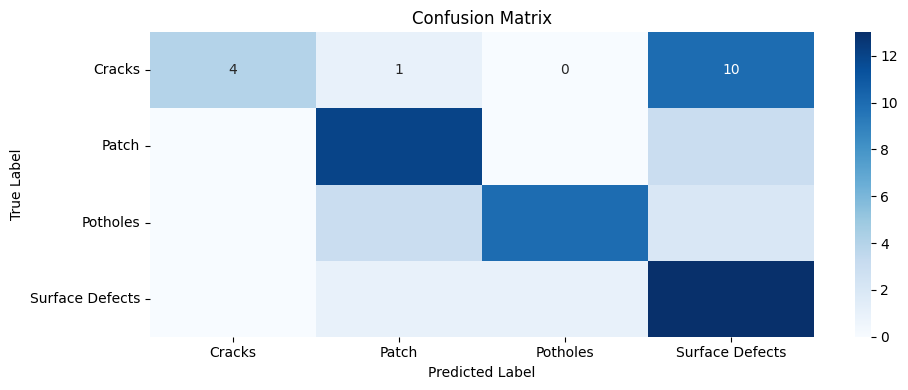

In [100]:
cm2 = confusion_matrix(y_true_mobile, y_pred_class_mobile)
plt.figure(figsize=(10,4))
sns.heatmap(cm2, annot=True, fmt="d", xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

Berdasarkan Hasil Visualisasi:
1. Ketidakseimbangan kelas yang signifikan dalam predict.
2. Pada Cracks 10/15 Diklasifikasikan Sebagai Surface Defects
3. Jika Melihat Dari Warna Pada Patch Serta Surface Defects Terpredict Secara Baik Yaitu Dikisaran 12/15 Sample.
4. Namun Pada Cracks Dan Potholes Masih Di Terjadi Missclassfication.

### 7.1.4 Model Improvement Using MobileNetV2 Recommendation

Hasil Model Improvement Menggunakan MobileNetV2 Menunjukkan Adanya Improvement Dibandingkan Base Model. Namun, Ada Beberapa Bias Pada Kelas Patch Dan Defects. Juga Data Ini Masih Slightly Overfit Mengacu Pada Hasil Accuracy Train Dan Validation Pada Epoch 4. Namun, Ketika Dilakukan Predict Hasil Test Accuracy Memiliki Nilai Lebih Bagus. Sehingga Bisa Juga Dikatakan 'Goodfit'. Namun, Dikarenakan Beberapa Hasil Lain Seperti Pada Confusion Metrics Memperlihatkan Masih Adanya Bias Atau Misslabelling.

Sehingga, Ada Beberapa Rekomendasi Untuk Mengimprove Model Ini Kembali:
1. Memperbanyak Dataset Yang Lebih Repsentative.
2. Melakukan Architecture Yang Lebih Kompleks
3. Juga Menambahkan beberapa Regularization Pada Architecture
4. Juga Augmentasi Yang Lebih Sesuai
5. Bisa Juga dengan Mencoba Transfer Learning Lainnya.

## 7.2 Model Improvement Using DenseNet121

Alasan Penggunaan:
1. DenseNet121 memanfaatan fitur yang lebih baik dan pembelajaran yang lebih efisien.
2. Parameter Lebih Sedikit sehingga Mengurangi overfitting, juga pelatihan lebih cepat.
3. Telah Dilatih sebelumnya pada ImageNet sehingga dapat Membantu pada dataset kecil.
4. Generalisasi yang Kuat Sehingga Mampu Untuk Memecahkan masalah Accuracy Val yang buruk pada MobileNetV2.

### 7.2.1 Define Model Improvement Using DenseNet121 

In [38]:
# Define DenseNet121
densenet = DenseNet121(include_top=False, weights='imagenet', input_shape=(img_height, img_width, 3))
densenet.trainable = False

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [39]:
# DenseNet121 Summary
densenet.summary()

Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 7,037,504 (26.85 MB)

### 7.2.2 Model Improvement Using DenseNet121 Architecture

In [48]:
# Architecture + DenseNet121
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

model_tl2 = Sequential()

model_tl2.add(densenet)
model_tl2.add(GlobalAveragePooling2D())
model_tl2.add(Dropout(0.3))
model_tl2.add(Dense(128, activation='relu'))
model_tl2.add(Dropout(0.3))

model_tl2.add(Dense(4, activation='softmax'))  # 4 classes

# Compile
model_tl2.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

# Summary
model_tl2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)        │ (None, 7, 7, 1024)     │     7,037,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,169,220 (27.35 MB)

 Trainable params: 131,716 (514.52 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

In [49]:
history_dense = model_tl2.fit(train, epochs=35, validation_data=val, callbacks= [earlystop2, reduce_lr])

Epoch 1/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 48s 3s/step - accuracy: 0.2633 - loss: 1.7067 - val_accuracy: 0.3333 - val_loss: 1.2440 - learning_rate: 0.0010
Epoch 2/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 33s 2s/step - accuracy: 0.5163 - loss: 1.1961 - val_accuracy: 0.4500 - val_loss: 1.1437 - learning_rate: 0.0010
Epoch 3/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.4903 - loss: 1.1438 - val_accuracy: 0.5333 - val_loss: 1.0077 - learning_rate: 0.0010
Epoch 4/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.5351 - loss: 1.0380 - val_accuracy: 0.5500 - val_loss: 0.9960 - learning_rate: 0.0010
Epoch 5/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 37s 3s/step - accuracy: 0.5468 - loss: 1.0024 - val_accuracy: 0.6167 - val_loss: 0.9245 - learning_rate: 0.0010
Epoch 6/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.6285 - loss: 0.9268 - val_accuracy: 0.6500 - val_loss: 0.8827 - learning_rate: 0.0010
Epoch 7/35
14/14 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step - accuracy: 0.6154 - loss: 0.9378 - val_accuracy: 

Data Ini Telah Di Run Dalam Beberapa Percobaan, Salah Satunya Dengan Memodifikasi Architecturenya.
Epoch Yang Dilakukan Mulai Dari 25 Namun Tidak Terjadi Callbacks Sehingga Di Indikasi Bahwa Dalam Beberapa layer Kedepan Bisa Improve.
Namun, Ternyata Setelah Di Adjust Epoch 35 Model Melakukan Callbacks Dan Mengambil Epoch 18.

Sehingga Berdasarkan Hasil Train Dan Epoch Terbaik Mengacu Pada Parameters 'Callbacks':
1. Epoch 18 Yang Menjadi Hasil Terbaik.
2. Accuracy: 0.6760
3. loss: 0.7703
4. val_accuracy: 0.7667 
5. val_loss: 0.7211 

Sehingga Model Ini Dapat Dikategorikan 'Goodfit'. Dikarenakan Accuracy Lebih Baik Pada Train Dibandingkan Val.

### 7.2.3 Model Improvement Using DenseNet121 Evaluation

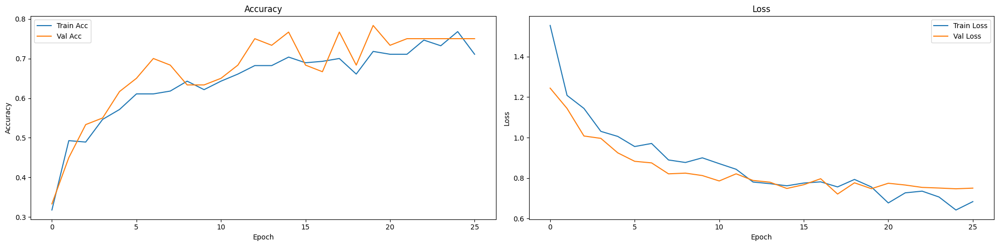

In [50]:
fig, axes = plt.subplots(1, 2, figsize=(20, 5))

axes[0].plot(history_dense.history['accuracy'], label='Train Acc')
axes[0].plot(history_dense.history['val_accuracy'], label='Val Acc')
axes[0].set_title('Accuracy')
axes[0].legend()
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')

axes[1].plot(history_dense.history['loss'], label='Train Loss')
axes[1].plot(history_dense.history['val_loss'], label='Val Loss')
axes[1].set_title('Loss')
axes[1].legend()
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')

plt.tight_layout()
plt.show()

Berdasarkan Hasil Visualisasi Terlihat Bahwa:
1. Accuracy Pada Train meningkat secara konsisten dari 0,40 hingga 0,75.
2. Accuracy Pada Val mengikuti tren serupa, berakhir sekitar 0,77.
3. Kedua kurva tersebut berdekatan Baik Pada Accuracy(Accuracy Tinggi) Dan Loss(Loss Rendah) menunjukkan generalisasi yang baik.
4. Train Loss menurun secara bertahap dari sekitar 1,3 menjadi di bawah 0,8.
5. Val Loss juga menurun konvergen dengan Train Loss.

Sehingga:
1. DenseNet121 belajar dengan baik.
2. Tidak ada underfitting atau overfitting bahkan dapat dibilang 'goodfit' pada dataset ini
3. Model ini tergeneralisasi dengan baik antara train dan validation set.

In [84]:
y_pred_dense = model_tl2.predict(test)
y_pred_class_dense = np.argmax(y_pred_dense, axis=1)
y_true_dense = test.classes

3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step


In [85]:
print(classification_report(y_true_dense, y_pred_class_dense, target_names=class_labels, zero_division=0))

                 precision    recall  f1-score   support

         Cracks       0.89      0.53      0.67        15
          Patch       0.92      0.80      0.86        15
       Potholes       0.75      0.80      0.77        15
Surface Defects       0.64      0.93      0.76        15

       accuracy                           0.77        60
      macro avg       0.80      0.77      0.76        60
   weighted avg       0.80      0.77      0.76        60



Berdasarkan Hasil Classification Report:
1. Cracks: Presisi tinggi (0.89) tetapi recall rendah (0.53) Artinya model akurat tetapi banyak Misslabel Cracks.
2. Patch dan Pothole: Hasilnya Balance Dan baik.
3. Surface Defects: Recall tertinggi (0,93) tetapi presisi terendah (0,64) Artinya model terlalu sering memprediksi kelas ini.  
4. macro avg pada recall (0,77) menunjukkan keseimbangan kelas yang Moderate, tetapi dengan bias ke arah Surface Defects karena recall-nya yang tinggi.  
5. Akurasi keseluruhan = 77% Artinya hasil yang baik untuk dataset ini.

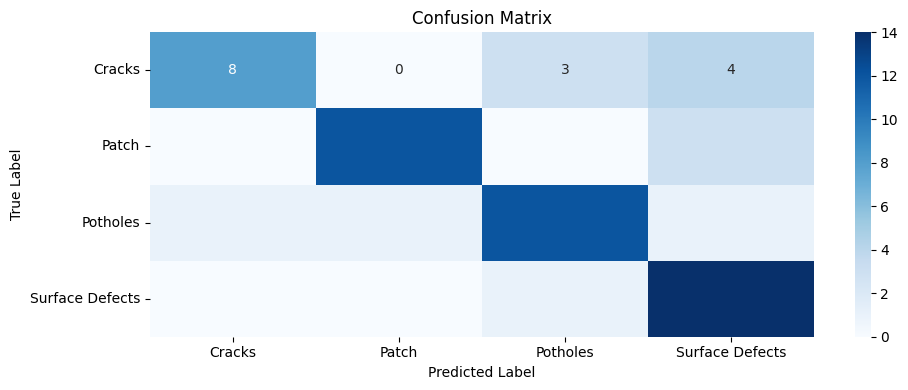

In [92]:
cm3 = confusion_matrix(y_true_dense, y_pred_class_dense)
plt.figure(figsize=(10,4))
sns.heatmap(cm2, annot=True, fmt="d", xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()

Berdasarkan Hasil Visualisasi, Mengacu Pada Warna Dan Angka:
1. Cracks: 8/15 benar. Sering Misslabel Kepada Potholes dan surface defects.
2. Patch: 12/15 benar.
3. Potholes: 12/15 benar. Beberapa Misslabel dengan patch dan surface defects
4. Surface Defects: 14/15 benar. Hasil Baik.Tetapi terlalu Sering diprediksi(bias). dilihat dari high recall namun low precision.

### 7.2.4 Model Improvement Using DenseNet121 Recommendatio4

Hasil Model Improvement Menggunakan DenseNet Menunjukkan Adanya Improvement Dibandingkan Base Model Dan Juga MobileNetV2. Namun, Ada Beberapa Bias Pada Kelas Surface Defects. Namun, hasil ini dapat diindikasikan goodfit mengacu pada hasil accuracy pada test dan validation lebih bagus daripada train set.

Sehingga, Ada Beberapa Rekomendasi Untuk Mengimprove Model Ini Kembali:
1. Memperbanyak Dataset Yang Lebih Repsentative.
2. Melakukan Architecture dengan Layer Yang Lebih Banyak Dan Lebih Dalam.
3. Juga Menambahkan beberapa Regularization Pada Architecture.
4. Juga Augmentasi Yang Mungkin bisa ditambahkan.

# 8. Model Evaluation

## 8.1 Classification Report

In [90]:
print(classification_report(y_true, y_pred_class, target_names=class_labels, zero_division=0))

                 precision    recall  f1-score   support

         Cracks       0.00      0.00      0.00        15
          Patch       0.00      0.00      0.00        15
       Potholes       0.25      1.00      0.40        15
Surface Defects       0.00      0.00      0.00        15

       accuracy                           0.25        60
      macro avg       0.06      0.25      0.10        60
   weighted avg       0.06      0.25      0.10        60



In [91]:
print(classification_report(y_true_mobile, y_pred_class_mobile, target_names=class_labels, zero_division=0))
print(classification_report(y_true_dense, y_pred_class_dense, target_names=class_labels, zero_division=0))

                 precision    recall  f1-score   support

         Cracks       1.00      0.27      0.42        15
          Patch       0.71      0.80      0.75        15
       Potholes       0.91      0.67      0.77        15
Surface Defects       0.46      0.87      0.60        15

       accuracy                           0.65        60
      macro avg       0.77      0.65      0.64        60
   weighted avg       0.77      0.65      0.64        60

                 precision    recall  f1-score   support

         Cracks       0.89      0.53      0.67        15
          Patch       0.92      0.80      0.86        15
       Potholes       0.75      0.80      0.77        15
Surface Defects       0.64      0.93      0.76        15

       accuracy                           0.77        60
      macro avg       0.80      0.77      0.76        60
   weighted avg       0.80      0.77      0.76        60



Mengacu Pada Hasil Classification:
1. Diantara 3 Model, Model Dengan Menggunakan Transfer Learning DenseNet121 Memiliki Hasil Terbaik.
2. Hal Ini Dilihat Berturut-turut Mulai Dari Accuracy, Val_Loss, Dan Juga Beberapa Metrics Lainnya.

## 8.2 Confusion Metrics

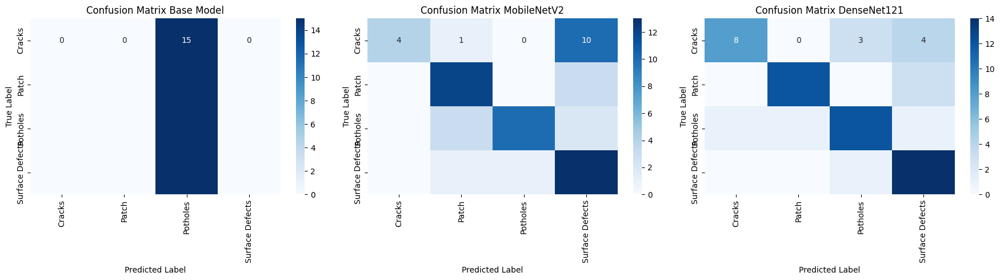

In [97]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Titles for each confusion matrix
titles = ['Confusion Matrix Base Model', 'Confusion Matrix MobileNetV2', 'Confusion Matrix DenseNet121']

# Confusion matrices (reuse cm2, cm, cm3)
conf_matrices = [cm, cm2, cm3]

# Plot each heatmap
for i, ax in enumerate(axes):
    sns.heatmap(conf_matrices[i], annot=True, fmt="d",
                xticklabels=class_labels, yticklabels=class_labels,
                cmap="Blues", ax=ax)
    ax.set_title(titles[i])
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')

plt.tight_layout()
plt.show()

Berdasarkan Dari Hasil Confusion Metrics Pun Terlihat:
1.Base Model
- Hanya mampu memprediksi seluruh label sebagai Potholes.
- Tidak mampu membedakan kelas lain seperti Cracks, Patch, dan Surface Defects.

Sehingga buruk dalam klasifikasi multi-kelas.
2.  MobileNetV2

- Meningkatkan klasifikasi untuk semua kelas.
- Namun, kelas Cracks dan Surface Defects masih sering tertukar.

Misalnya: dari 15 data Cracks, hanya 4 yang terklasifikasi benar, dan 10 malah diprediksi sebagai Surface Defects.

3. DenseNet121

- Performa terbaik dari ketiganya.
- Kelas Cracks: 8 benar dari 15, meningkat dari MobileNetV2 (4).
- Kelas Surface Defects juga lebih baik dipredict (12 benar).
- Masih terdapat kesalahan pada kelas Potholes dan sebagian kecil pada Patch.

> Sehingga Berdasarkan Hasil Evaluation Ini Model Yang Dipakai Sebagai Best Model Adalah Model Yang Menggunakan Transfer Learning DenseNet121

# 9. Model Saving

In [98]:
model_tl2.save('Dense_Model.keras')

In [103]:
model_tl2.save("Dense_Model_For_Deploy.keras", save_format="keras_v3")

print("✅ Model saved in Keras 3 format, ready for Hugging Face.")

✅ Model saved in Keras 3 format, ready for Hugging Face.


# 10. Model Inference

> Inference In P2G7_Inference.ipynb

# 11. Conclusion

1. Data Terdiri Dari 4 Classes (Cracks, Patch, Potholes, Surface Defects).
2. Tiap Class Mengintrepetasikan Sebuah Ciri Yang Berbeda-beda.
3. Dalam Melakukan Model Digunakan Beberapa Images Augmentation Untuk Mempermudah Model Dalam Belajar.
4. Adapun Melakukan Resize Pada Image Sehingga Semua Memiliki Size Yang Sama Serta Dapat Dengan Mudah Digunakan Dalam Transfer Learning.
5. Model Yang Digunakan Ada 3:
- Dimulai Dari Base Model Yaitu CNN Architecture Biasa
- Dilanjutkan Dengan MobileNetV2
- Diakhiri Dengan DenseNet121
6. Berdasarkan Hasil Uji Model, Model Terbaik Adalah Transfer Learning DenseNet121. Mengacu Pada Hasil Classification Test Serta Confusion Metrics.
7. Mengapa Juga DenseNet121, Dikarenakan Pada Base Model Dan Juga MobilNetV2 Hasilnya Adalah Model Terindikasi 'Overfit'
8. Sedangkan Pada DenseNet121 Atau BestModel Terlihat GoodFit.
9. Maka BestModel Ini Akan Di Save Untuk Digunakan Pada Inference Serta, Deployment.

Recommendation:
Mirip Pada Setiap Evaluasi Bahwa Hasil Terbaik Adalah Ketika Model Bisa Memprediksi Secara Keselurahan Dengan Accuracy 100%. Sehingga Jika Belum Mencapai Tersebut, Model Akan Selalu Bisa Di Improve. Berikut Recommendation Untuk Mendapatkan Model Lebih Baik Lagi:
1. Memperbanyak Dataset Yang Lebih Repsentative.
2. Melakukan Architecture dengan Layer Yang Lebih Banyak Dan Lebih Dalam.
3. Juga Menambahkan beberapa Regularization Pada Architecture.
4. Juga Augmentasi Yang Mungkin bisa ditambahkan.
5. Terakhir Mencari Model Terbaik Dan Selalu Melakukan Improvement.